# **Imports**

In [ ]:
import os
import kagglehub
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np
from PIL import Image, ImageDraw
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam


# **Download the Dataset**

In [ ]:
# Download the dataset
dataset_path = kagglehub.dataset_download("dasmehdixtr/drone-dataset-uav")
print("Path to dataset files:", dataset_path)
print("Contents of dataset directory:")

for dir_path, subdirs, files in os.walk(dataset_path):
    print(dir_path)
    for file in files:
        print("  -", file)
    print("Number of files:", len(files))


Path to dataset files: /root/.cache/kagglehub/datasets/dasmehdixtr/drone-dataset-uav/versions/4
Contents of dataset directory:
/root/.cache/kagglehub/datasets/dasmehdixtr/drone-dataset-uav/versions/4
Number of files: 0
/root/.cache/kagglehub/datasets/dasmehdixtr/drone-dataset-uav/versions/4/dataset_xml_format
Number of files: 0
/root/.cache/kagglehub/datasets/dasmehdixtr/drone-dataset-uav/versions/4/dataset_xml_format/dataset_xml_format
  - pic_852.jpg
  - pic_315.jpg
  - pic_146.xml
  - pic_437.jpg
  - moto08295.xml
  - yoto01422.xml
  - moto00030.png
  - foto04960.png
  - pic_320.jpg
  - pic_564.xml
  - moto13109.png
  - pic_1096.jpg
  - pic_382.jpg
  - foto01799.xml
  - moto05337.xml
  - pic_420.jpg
  - foto04438.png
  - pic_683.jpg
  - pic_515.xml
  - pic_752.jpg
  - pic_343.jpg
  - pic_048.jpg
  - moto07512.png
  - pic_434.xml
  - pic_201.jpg
  - pic_696.jpg
  - pic_250.xml
  - pic_472.xml
  - pic_331.jpg
  - pic_039.xml
  - pic_763.jpg
  - foto07483.png
  - moto16357.png
  - pic_

# **Load Files and define the dataset**

In [ ]:
data_directory = Path(dataset_path, "drone_dataset_yolo", "dataset_txt")

# Load images and annotations
image_formats = ["*.jpg", "*.png", "*.JPG"]
image_paths = [img for fmt in image_formats for img in data_directory.glob(fmt)]
annotation_paths = list(data_directory.glob("*.txt"))

image_paths.sort()
annotation_paths.sort()

print("Total images: ", len(image_paths))
print("Total TXT annotations: ", len(annotation_paths))


Total images:  1359
Total TXT annotations:  1360


# **Preproccesing**

In [ ]:
train_images = []
train_annotations = []

for img_path, anno_path in zip(image_paths, annotation_paths):
    img = Image.open(img_path).convert("RGB")
    resized_img = img.resize((256, 256))
    train_images.append(np.asarray(resized_img))

    try:
        with open(anno_path, 'r') as file:
            lines = file.readlines()
            boxes = []
            for line in lines:
                values = line.strip().split()
                if len(values) >= 5:
                    _, center_x, center_y, width, height = map(float, values)
                    x_min = (center_x - width / 2) * 256
                    y_min = (center_y - height / 2) * 256
                    x_max = (center_x + width / 2) * 256
                    y_max = (center_y + height / 2) * 256
                    boxes.append([x_min, y_min, x_max, y_max])
            train_annotations.append(boxes)
    except FileNotFoundError:
        print(f"Annotation file not found for image: {img_path}")

train_images = np.array(train_images)


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


# **Splitting and flatten the dataset**

In [ ]:
# Flatten annotations and images for training
flattened_annotations, flattened_images = zip(*[
    (bbox, img)
    for img, bboxes in zip(train_images, train_annotations)
    for bbox in bboxes
])

flattened_images = np.array(flattened_images)
flattened_annotations = np.array(flattened_annotations)

X_train, X_test, y_train, y_test = train_test_split(
    flattened_images, flattened_annotations, test_size=0.2, random_state=42
)

print(f"Training images: {X_train.shape}")
print(f"Training annotations: {y_train.shape}")
print(f"Testing images: {X_test.shape}")
print(f"Testing annotations: {y_test.shape}")


Training images: (1188, 256, 256, 3)
Training annotations: (1188, 4)
Testing images: (297, 256, 256, 3)
Testing annotations: (297, 4)


# **Visualize training images**

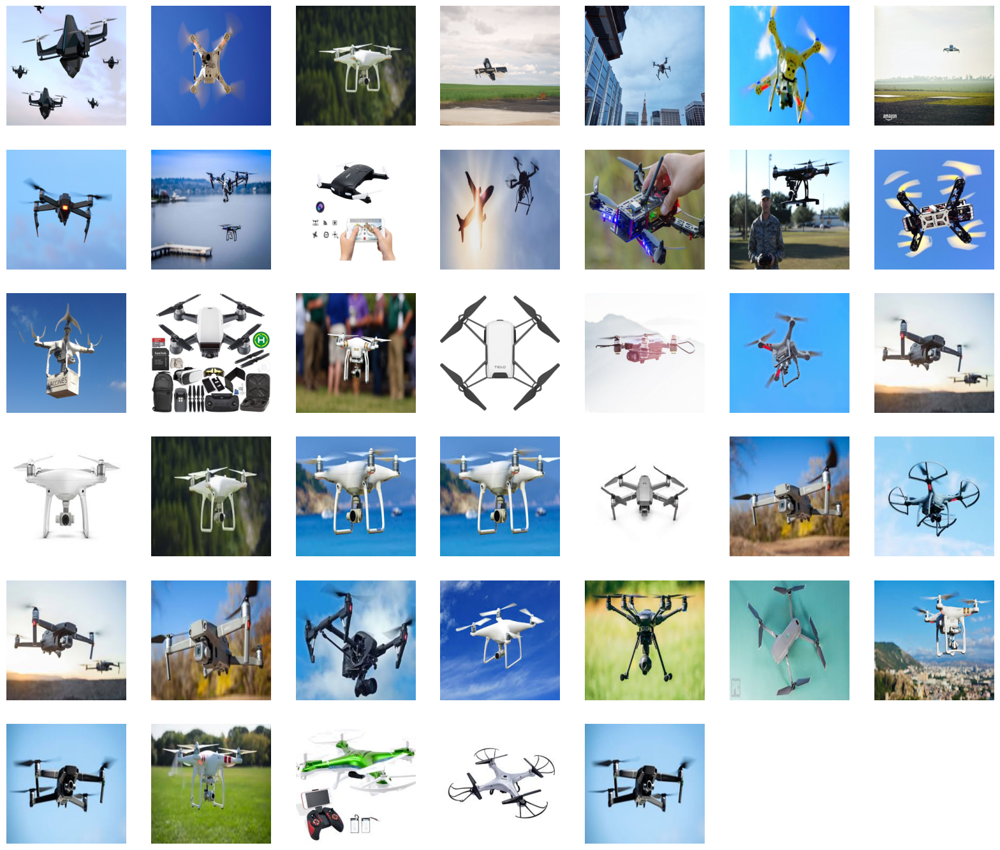

In [ ]:
# Visualization of images
plt.figure(figsize=(20, 20))

for i in range(40):
    ax = plt.subplot(7, 7, i + 1)
    plt.imshow(train_images[i].astype("uint8"))
    plt.axis("off")
plt.show()


# **Model with Vgg19 freeze the parameter means without fine-tuning**

In [ ]:
input_shape = (256, 256, 3)
base_model = VGG19(weights='imagenet', include_top=False, input_shape=input_shape)

x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dense(128, activation='relu')(x)
output_layer = Dense(4, activation='linear')(x)

model = Model(inputs=base_model.input, outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=['accuracy'])


# **Train model**

In [ ]:
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=10,
    batch_size=32,
    verbose=1
)


Epoch 1/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 45s 675ms/step - accuracy: 0.6696 - loss: 6003.2275 - val_accuracy: 0.7879 - val_loss: 2326.1721
Epoch 2/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - accuracy: 0.8399 - loss: 1579.3152 - val_accuracy: 0.7946 - val_loss: 2117.9058
Epoch 3/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - accuracy: 0.8777 - loss: 933.7518 - val_accuracy: 0.7845 - val_loss: 2057.0847
Epoch 4/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 8s 219ms/step - accuracy: 0.8676 - loss: 743.0771 - val_accuracy: 0.8013 - val_loss: 1943.6831
Epoch 5/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 9s 246ms/step - accuracy: 0.8738 - loss: 674.2007 - val_accuracy: 0.7946 - val_loss: 2162.9443
Epoch 6/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - accuracy: 0.8783 - loss: 549.1408 - val_accuracy: 0.7980 - val_loss: 1981.7439
Epoch 7/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - accuracy: 0.8875 - loss: 645.4301 - val_accuracy: 0.8047 - val_loss: 1977.1122
Epoch 8/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 9s 250ms/step - accuracy

# **Evaluating the model**

In [ ]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 177ms/step - accuracy: 0.7885 - loss: 1933.3262
Test Loss: 2049.80029296875
Test Accuracy: 0.7946127653121948


# **Visualize the predictions**

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 207ms/step


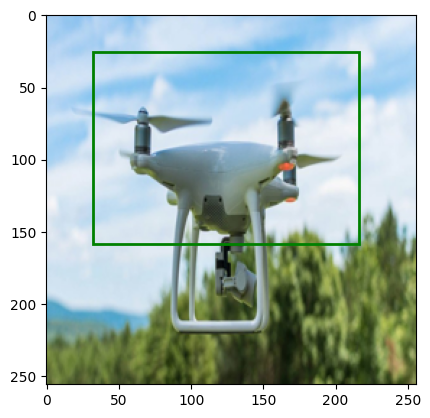

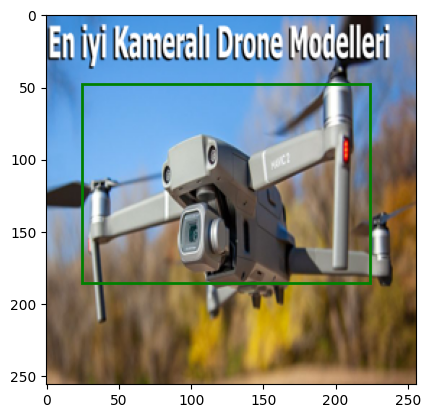

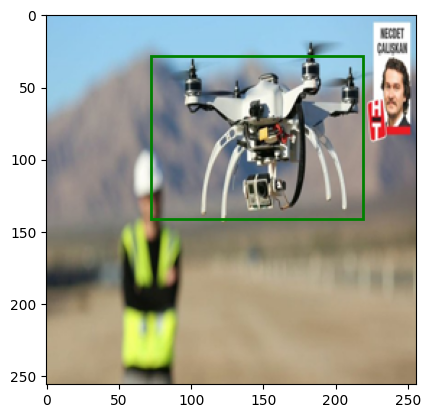

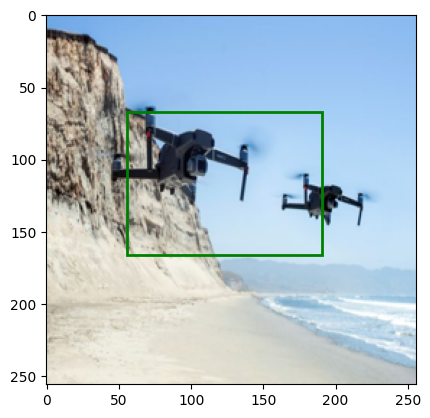

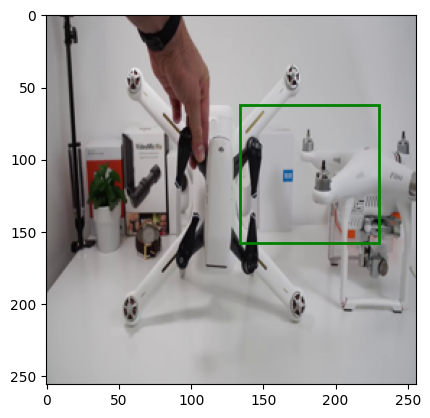

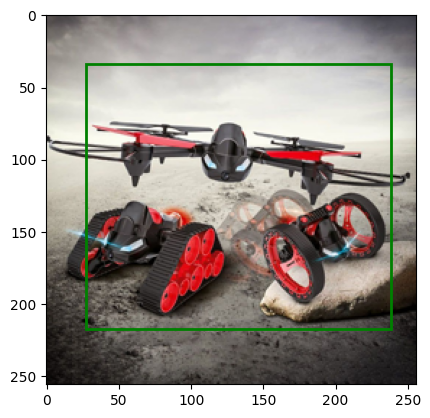

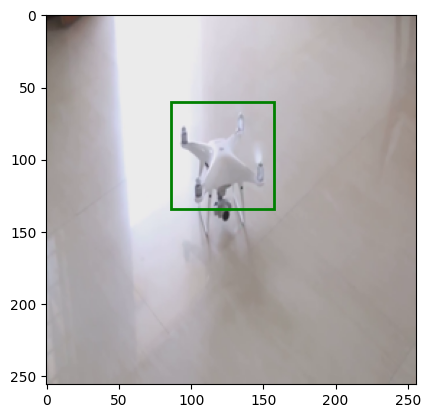

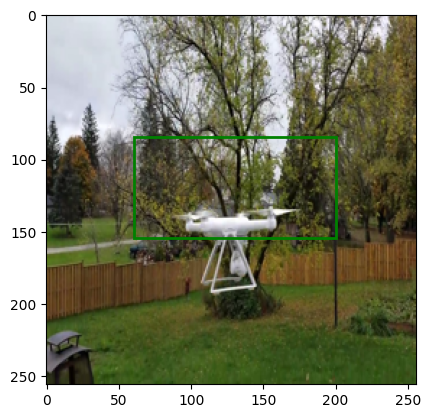

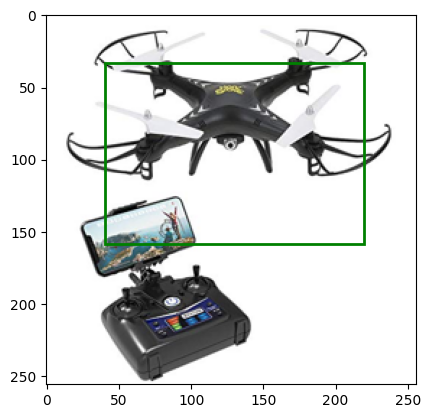

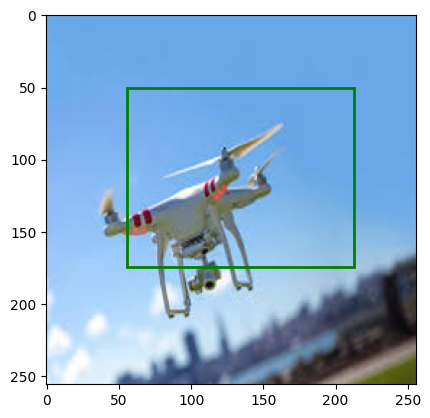

In [ ]:
predictions = model.predict(X_test)
for i in range(10):
    plt.imshow(X_test[i].astype("uint8"))
    pred_box = predictions[i]
    plt.gca().add_patch(
        plt.Rectangle(
            (pred_box[0], pred_box[1]),
            pred_box[2] - pred_box[0],
            pred_box[3] - pred_box[1],
            fill=False,
            edgecolor='green',
            linewidth=2
        )
    )
    plt.show()


# **Plot Training Accuracy**

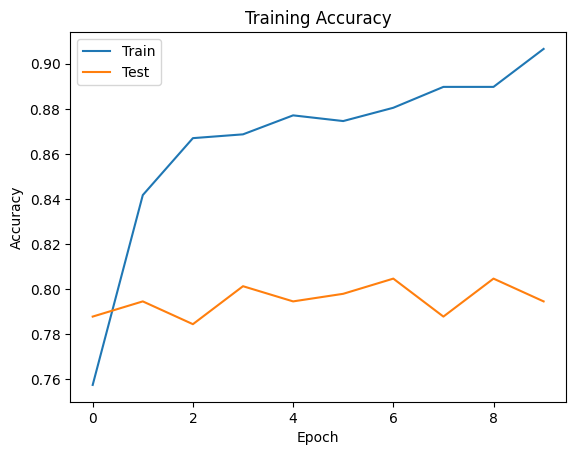

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Training Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


# **Fine-Tune the train model and unfreeze the last 10 layers**

Epoch 1/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 39s 572ms/step - accuracy: 0.8835 - loss: 597.7510 - val_accuracy: 0.7946 - val_loss: 2119.2727
Epoch 2/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 21s 419ms/step - accuracy: 0.9119 - loss: 433.7024 - val_accuracy: 0.7980 - val_loss: 2017.6637
Epoch 3/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 20s 401ms/step - accuracy: 0.9092 - loss: 347.5883 - val_accuracy: 0.7912 - val_loss: 2088.2485
Epoch 4/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 21s 425ms/step - accuracy: 0.9222 - loss: 358.1608 - val_accuracy: 0.8013 - val_loss: 2116.7329
Epoch 5/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 20s 424ms/step - accuracy: 0.9137 - loss: 497.0950 - val_accuracy: 0.7980 - val_loss: 2047.6442
Epoch 6/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 15s 405ms/step - accuracy: 0.9289 - loss: 326.3445 - val_accuracy: 0.8013 - val_loss: 2063.5359
Epoch 7/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 21s 420ms/step - accuracy: 0.9302 - loss: 347.6645 - val_accuracy: 0.8013 - val_loss: 2129.7529
Epoch 8/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 20s 403ms/step - accurac

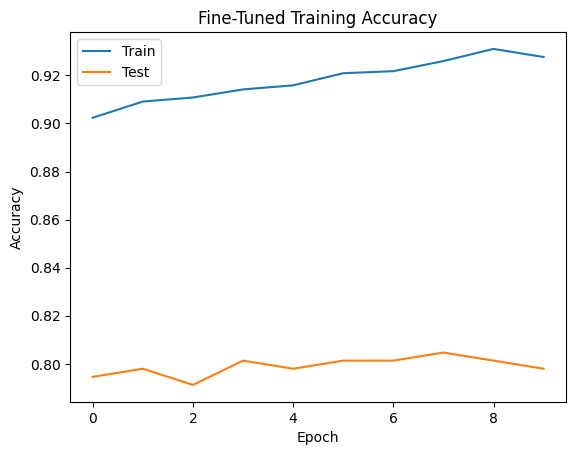

In [ ]:
# Unfreeze the last 10 layers for fine-tuning
for layer in base_model.layers[-10:]:
    layer.trainable = True

model.compile(optimizer=Adam(learning_rate=0.00001), loss='mean_squared_error', metrics=['accuracy'])

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=10,
    batch_size=32,
    verbose=1
)

# Plot fine-tuning accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Fine-Tuned Training Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


# **Visualize Predictions After Fine-Tuning**

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step


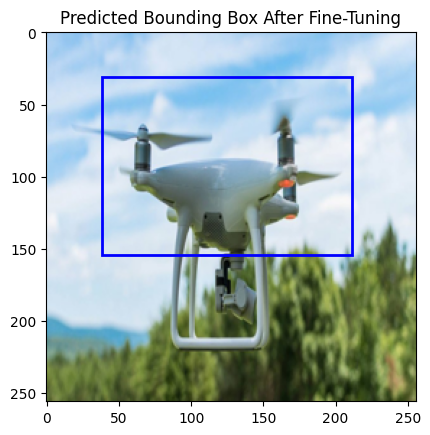

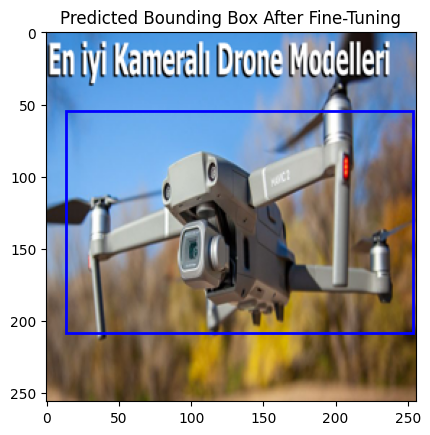

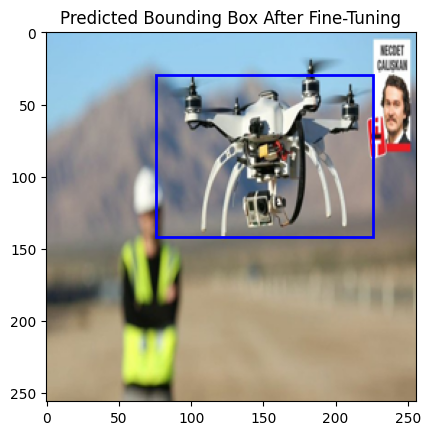

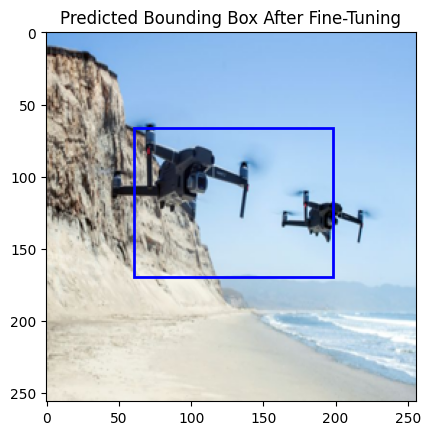

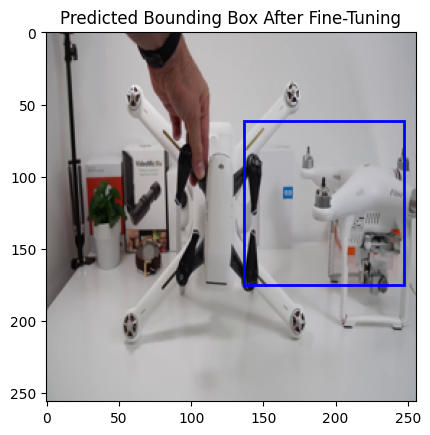

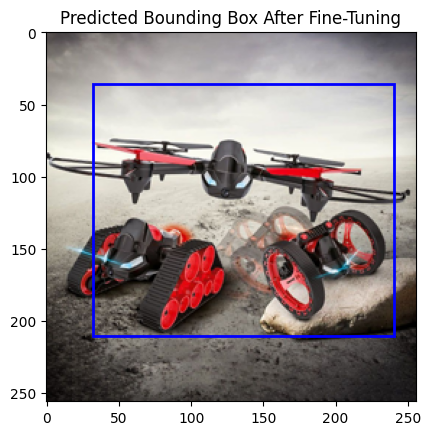

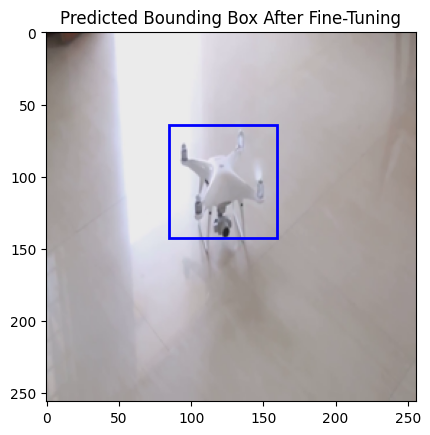

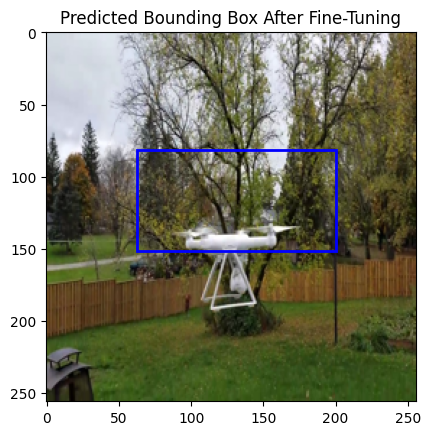

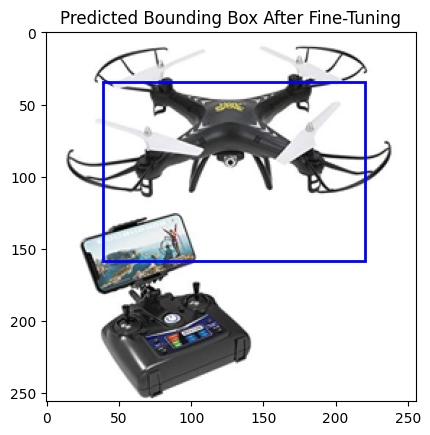

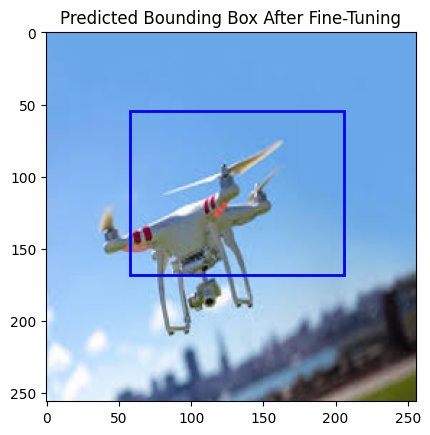

In [ ]:
# Predictions and visualization after fine-tuning
predictions_finetuned = model.predict(X_test)

for i in range(10):
    plt.imshow(X_test[i].astype("uint8"))
    pred_box = predictions_finetuned[i]
    plt.gca().add_patch(
        plt.Rectangle(
            (pred_box[0], pred_box[1]),
            pred_box[2] - pred_box[0],
            pred_box[3] - pred_box[1],
            fill=False,
            edgecolor='blue',
            linewidth=2
        )
    )
    plt.title("Predicted Bounding Box After Fine-Tuning")
    plt.show()


# **Trying to Use ResNet50 and ResNet101 and ResNet152**

In [ ]:
from tensorflow.keras.applications import ResNet50, ResNet101, ResNet152


In [ ]:
def create_resnet_model(resnet_variant, input_shape=(256, 256, 3)):
    if resnet_variant == "ResNet50":
        base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    elif resnet_variant == "ResNet101":
        base_model = ResNet101(weights='imagenet', include_top=False, input_shape=input_shape)
    elif resnet_variant == "ResNet152":
        base_model = ResNet152(weights='imagenet', include_top=False, input_shape=input_shape)
    else:
        raise ValueError("Unsupported ResNet variant")

    # Add custom layers
    x = Flatten()(base_model.output)
    x = Dense(256, activation='relu')(x)
    x = Dense(128, activation='relu')(x)
    output_layer = Dense(4, activation='linear')(x)

    model = Model(inputs=base_model.input, outputs=output_layer)

    # Freeze base model layers
    for layer in base_model.layers:
        layer.trainable = False

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=['accuracy'])
    return model


In [ ]:
# Initialize models
resnet50_model = create_resnet_model("ResNet50")
resnet101_model = create_resnet_model("ResNet101")
resnet152_model = create_resnet_model("ResNet152")

# Train ResNet-50
history_resnet50 = resnet50_model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=10,
    batch_size=32,
    verbose=1
)

# Train ResNet-101
history_resnet101 = resnet101_model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=10,
    batch_size=32,
    verbose=1
)

# Train ResNet-152
history_resnet152 = resnet152_model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=10,
    batch_size=32,
    verbose=1
)


Epoch 1/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 513ms/step - accuracy: 0.7415 - loss: 6287.5693 - val_accuracy: 0.7912 - val_loss: 1992.7603
Epoch 2/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - accuracy: 0.8387 - loss: 1264.0972 - val_accuracy: 0.7643 - val_loss: 1817.8754
Epoch 3/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.8636 - loss: 915.2669 - val_accuracy: 0.7643 - val_loss: 1871.1486
Epoch 4/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.8586 - loss: 762.1470 - val_accuracy: 0.8013 - val_loss: 1860.4714
Epoch 5/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - accuracy: 0.8729 - loss: 555.1254 - val_accuracy: 0.8249 - val_loss: 1916.0215
Epoch 6/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - accuracy: 0.8829 - loss: 486.7529 - val_accuracy: 0.8182 - val_loss: 1899.7325
Epoch 7/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - accuracy: 0.8811 - loss: 490.0238 - val_accuracy: 0.8283 - val_loss: 1874.0544
Epoch 8/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - accuracy: 

10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 466ms/step


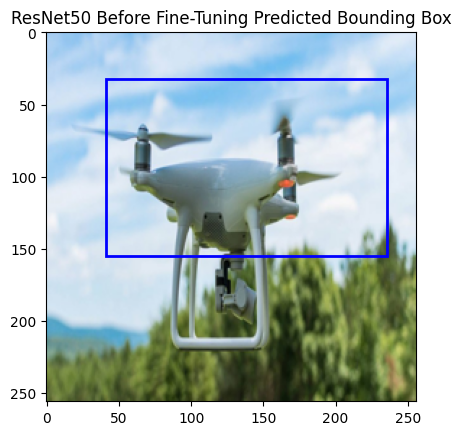

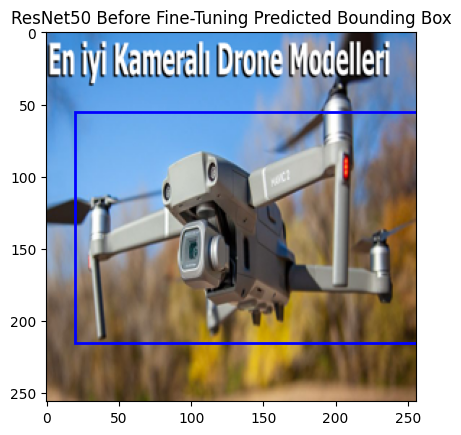

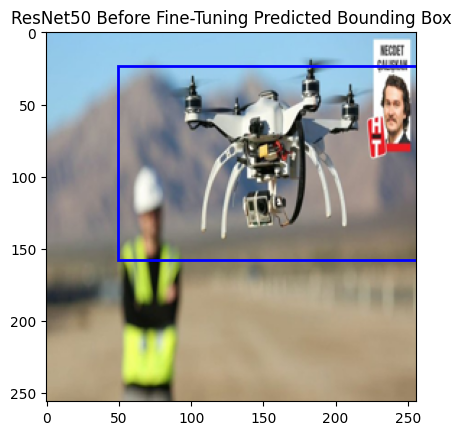

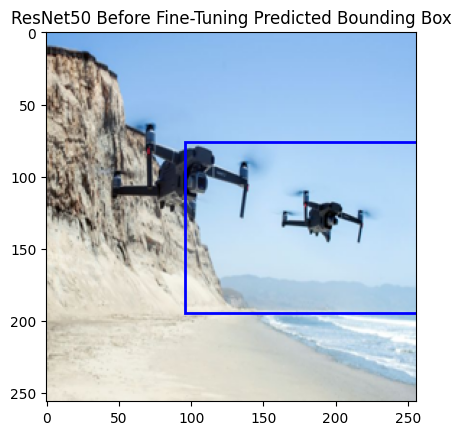

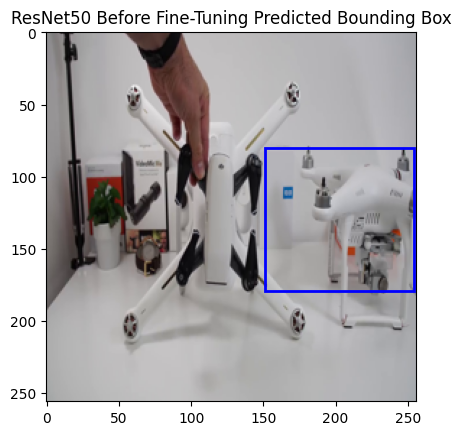

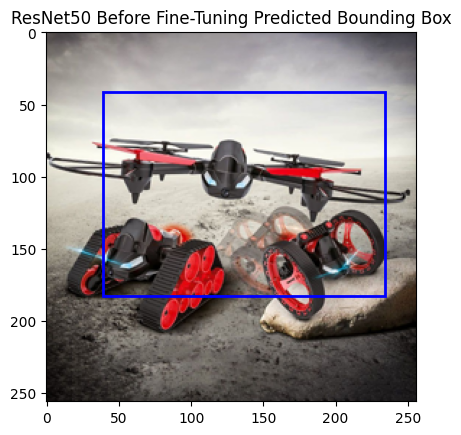

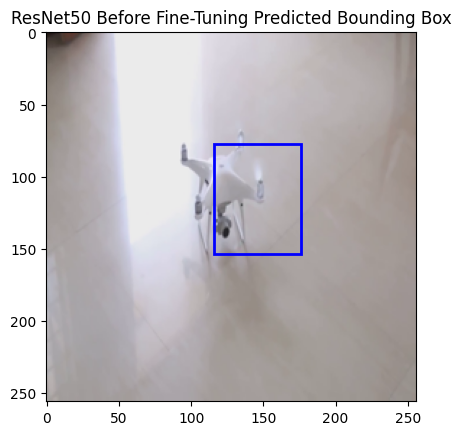

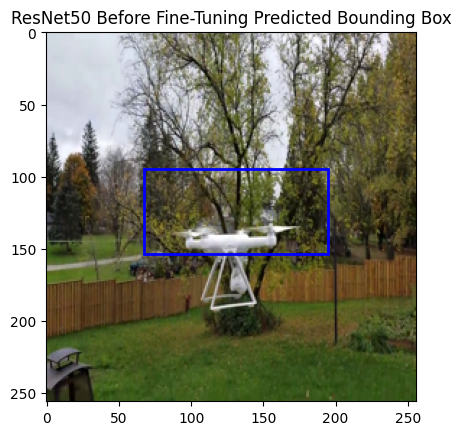

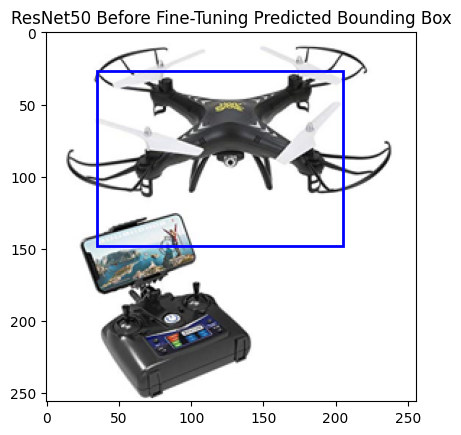

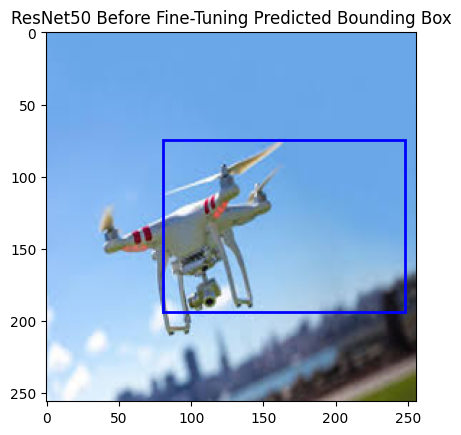

10/10 ━━━━━━━━━━━━━━━━━━━━ 13s 859ms/step


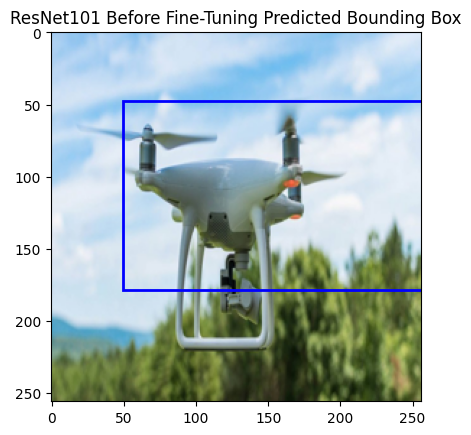

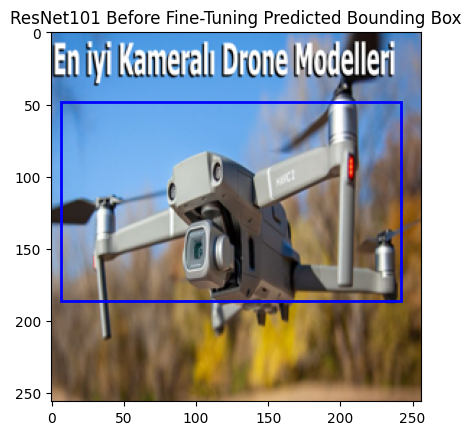

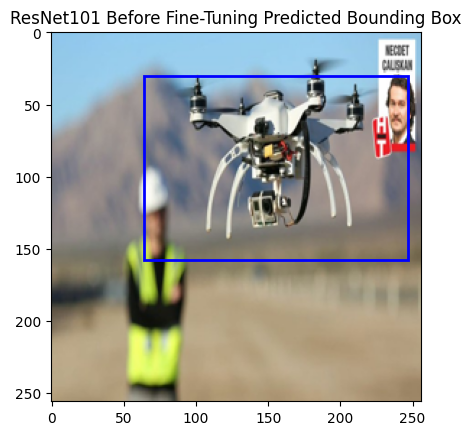

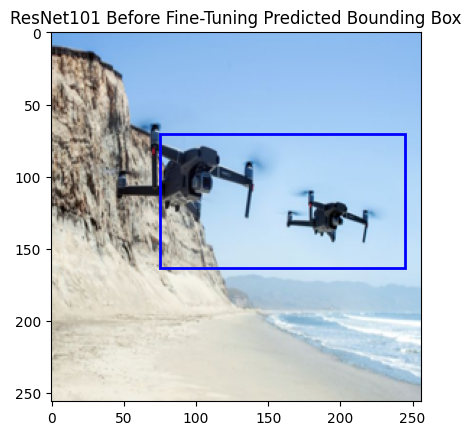

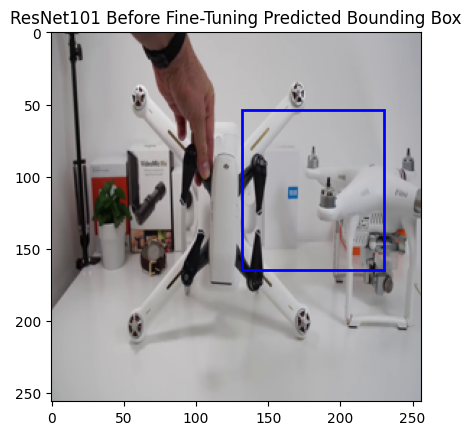

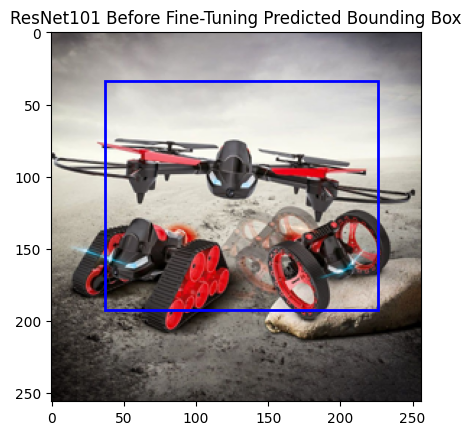

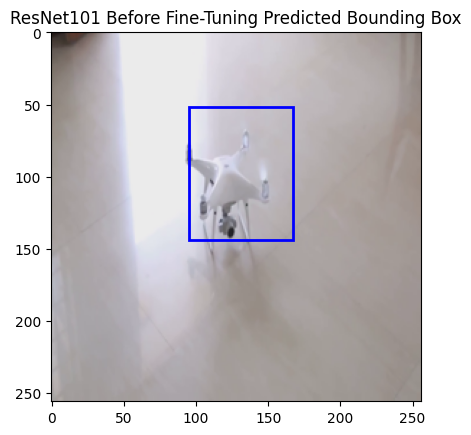

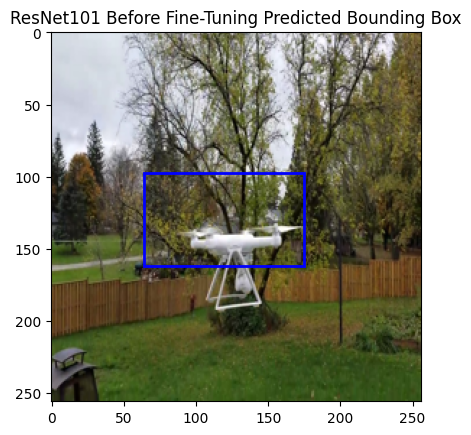

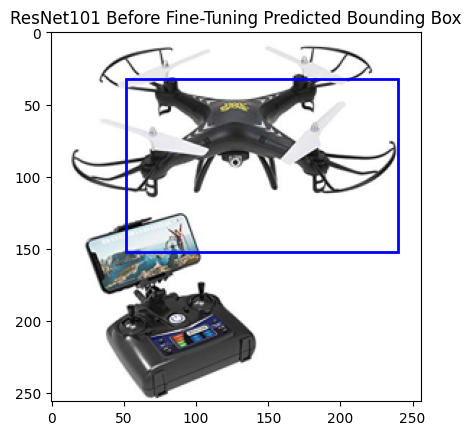

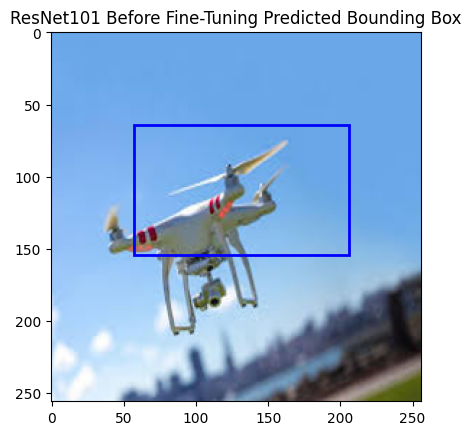

10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step


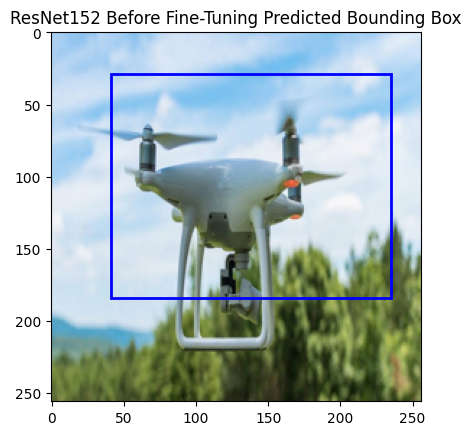

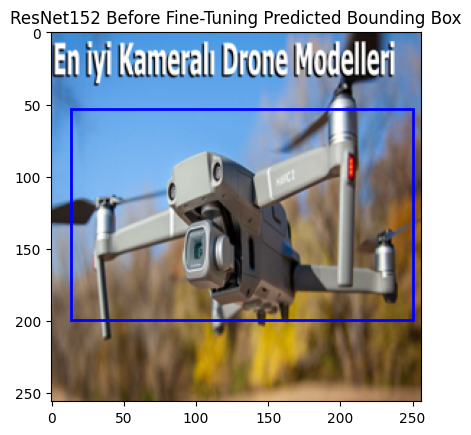

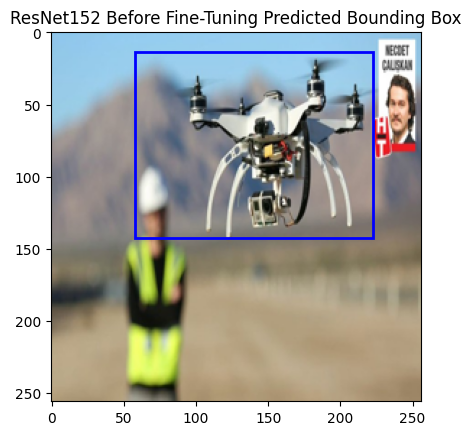

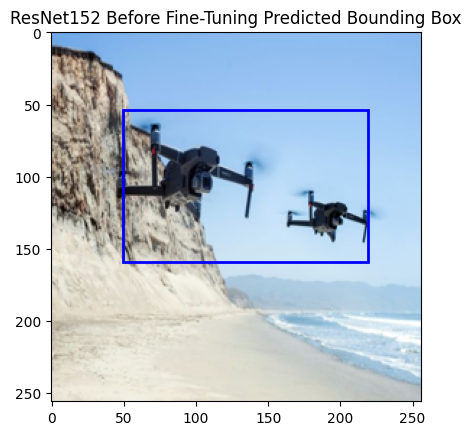

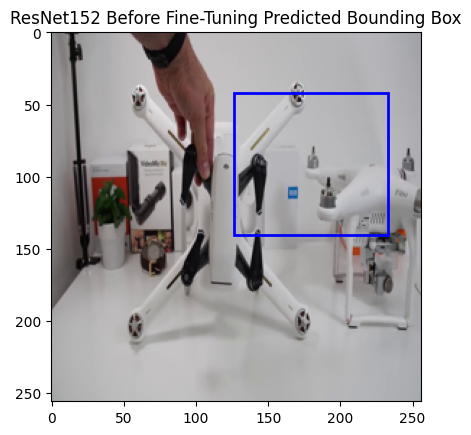

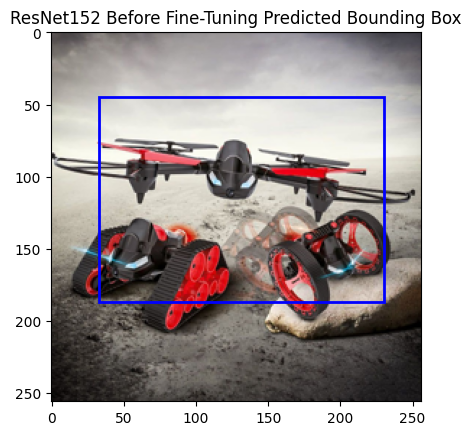

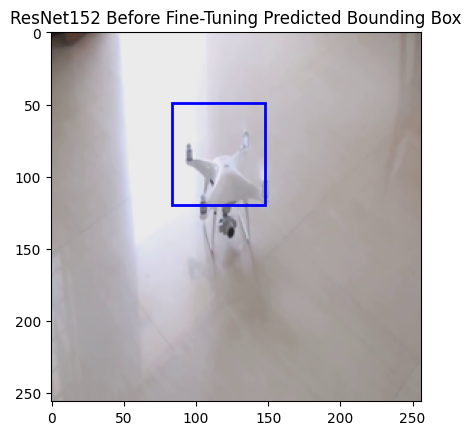

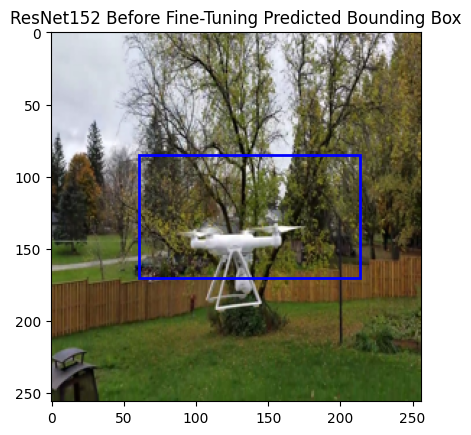

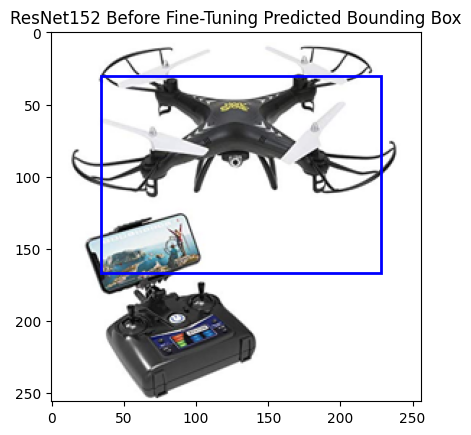

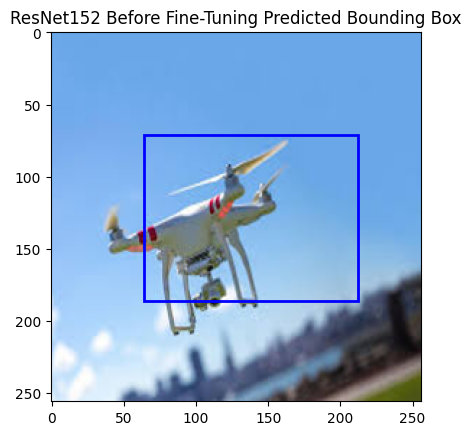

In [ ]:
def visualize_predictions(model, X_test, title_prefix):
    predictions = model.predict(X_test)
    for i in range(10):
        plt.imshow(X_test[i].astype("uint8"))
        pred_box = predictions[i]
        plt.gca().add_patch(
            plt.Rectangle(
                (pred_box[0], pred_box[1]),
                pred_box[2] - pred_box[0],
                pred_box[3] - pred_box[1],
                fill=False,
                edgecolor='blue',
                linewidth=2
            )
        )
        plt.title(f"{title_prefix} Predicted Bounding Box")
        plt.show()

# Visualize predictions before fine-tuning
visualize_predictions(resnet50_model, X_test, "ResNet50 Before Fine-Tuning")
visualize_predictions(resnet101_model, X_test, "ResNet101 Before Fine-Tuning")
visualize_predictions(resnet152_model, X_test, "ResNet152 Before Fine-Tuning")


In [ ]:
def fine_tune_model(model, base_model, num_layers_to_unfreeze=10):
    # Unfreeze the last `num_layers_to_unfreeze` layers of the base model
    for layer in base_model.layers[-num_layers_to_unfreeze:]:
        layer.trainable = True

    model.compile(optimizer=Adam(learning_rate=0.00001), loss='mean_squared_error', metrics=['accuracy'])

    # Fine-tune the model
    history = model.fit(
        X_train, y_train,
        validation_data=(X_test, y_test),
        epochs=10,
        batch_size=32,
        verbose=1
    )
    return history

# Fine-tune ResNet models with their respective base models
fine_tune_model(resnet50_model, resnet50_model, num_layers_to_unfreeze=10)
fine_tune_model(resnet101_model, resnet101_model, num_layers_to_unfreeze=10)
fine_tune_model(resnet152_model, resnet152_model, num_layers_to_unfreeze=10)


Epoch 1/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 26s 399ms/step - accuracy: 0.9301 - loss: 392.1566 - val_accuracy: 0.8114 - val_loss: 2041.3344
Epoch 2/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.9190 - loss: 370.0580 - val_accuracy: 0.8148 - val_loss: 1969.5945
Epoch 3/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 134ms/step - accuracy: 0.9205 - loss: 392.8163 - val_accuracy: 0.8182 - val_loss: 1946.1726
Epoch 4/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - accuracy: 0.9208 - loss: 397.2334 - val_accuracy: 0.8182 - val_loss: 1941.9058
Epoch 5/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 143ms/step - accuracy: 0.9172 - loss: 393.7122 - val_accuracy: 0.8182 - val_loss: 1946.6919
Epoch 6/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - accuracy: 0.9150 - loss: 345.5570 - val_accuracy: 0.8182 - val_loss: 1945.3951
Epoch 7/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - accuracy: 0.9358 - loss: 335.3589 - val_accuracy: 0.8148 - val_loss: 1950.7494
Epoch 8/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 11s 144ms/step - accuracy:

10/10 ━━━━━━━━━━━━━━━━━━━━ 8s 538ms/step


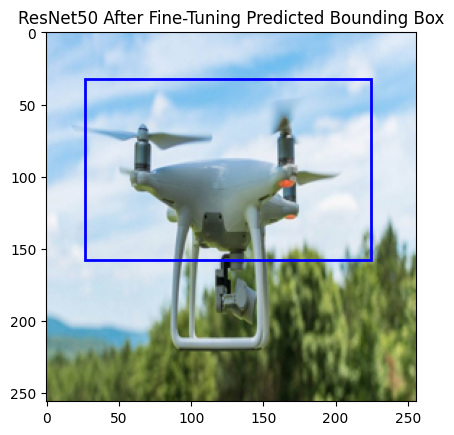

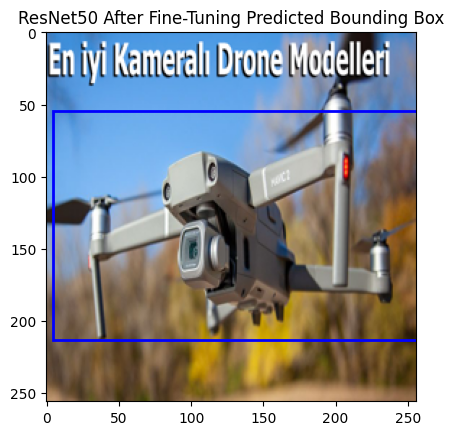

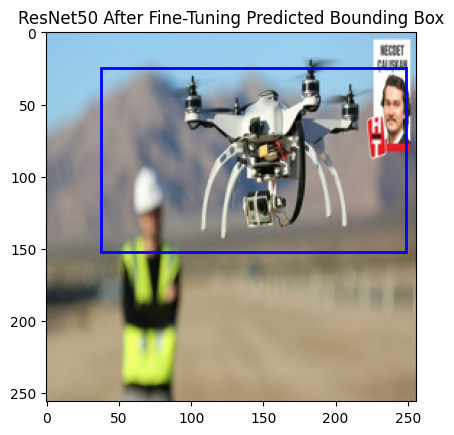

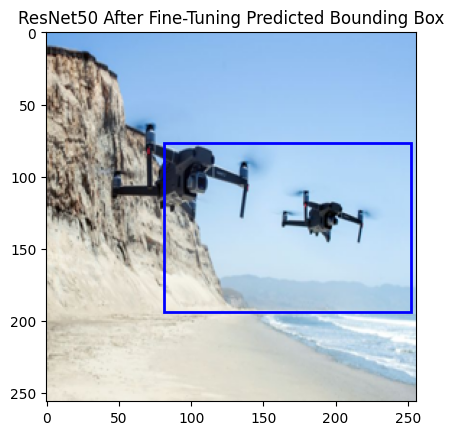

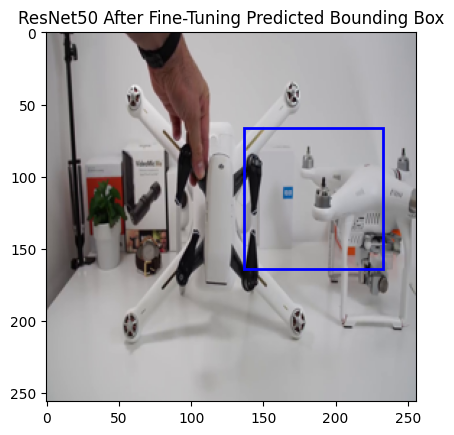

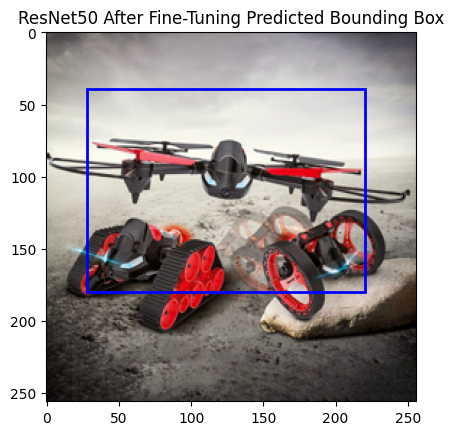

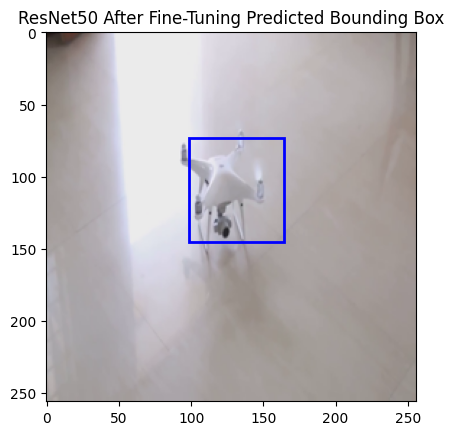

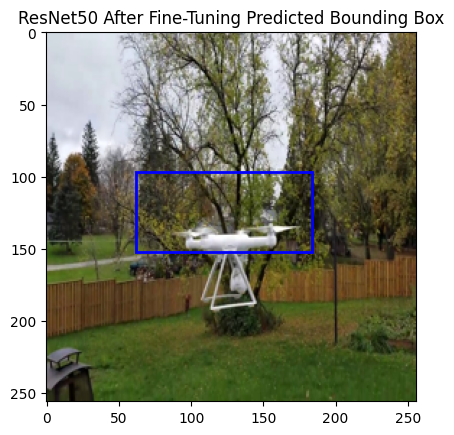

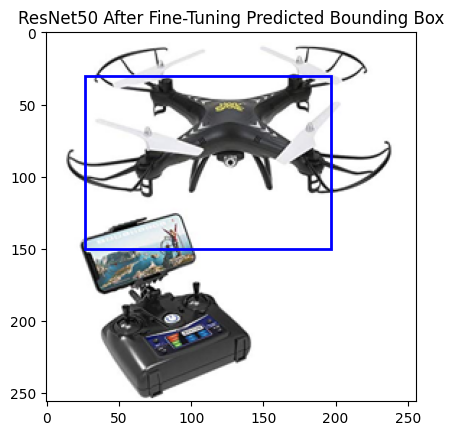

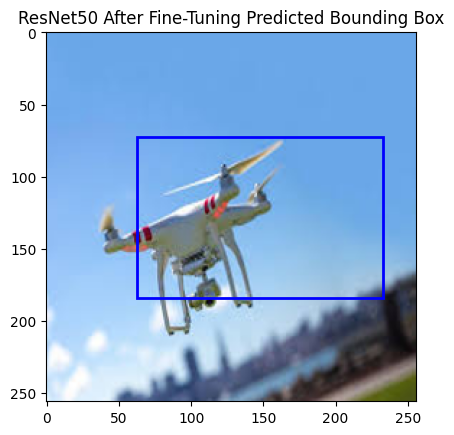

10/10 ━━━━━━━━━━━━━━━━━━━━ 13s 773ms/step


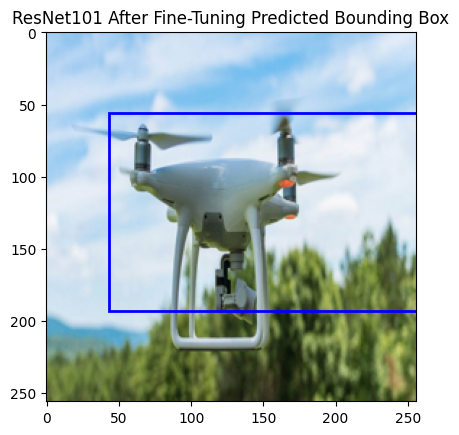

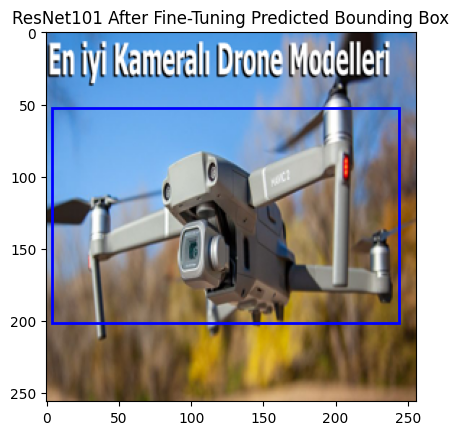

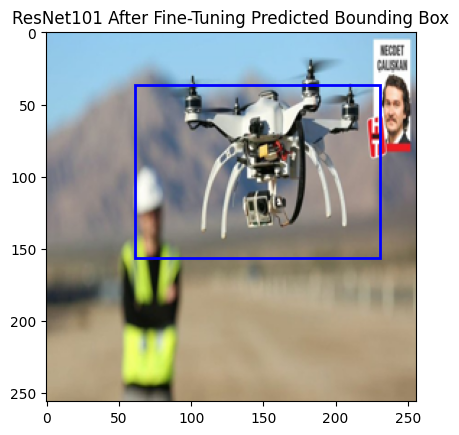

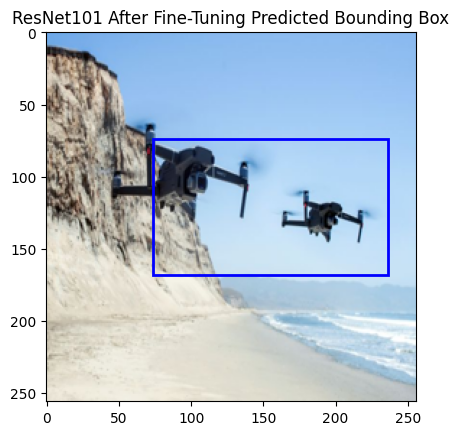

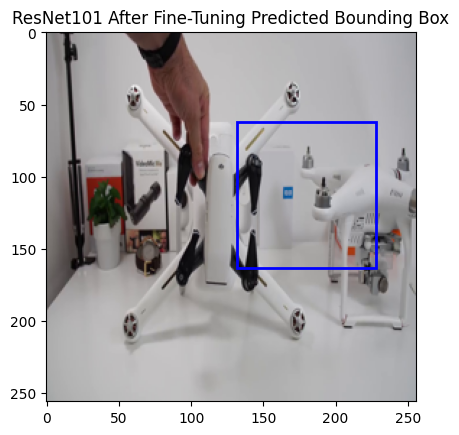

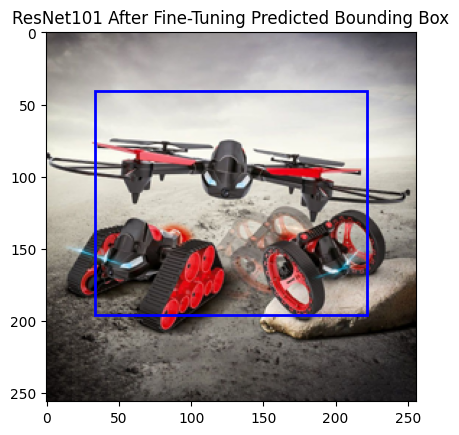

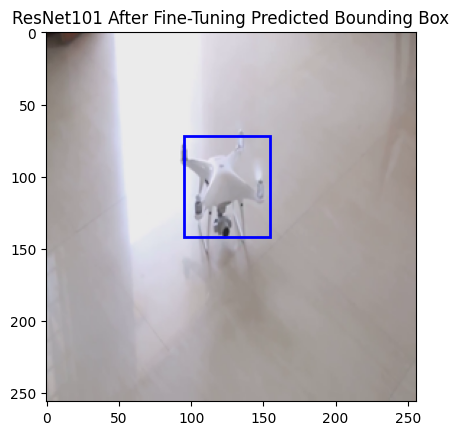

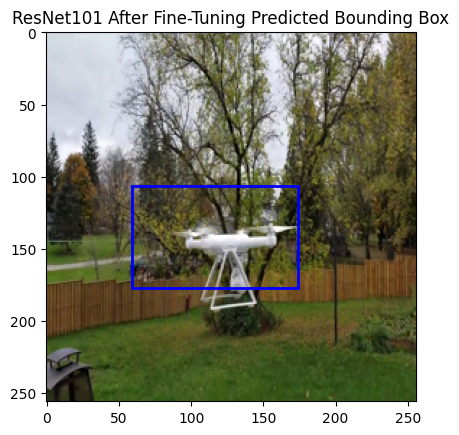

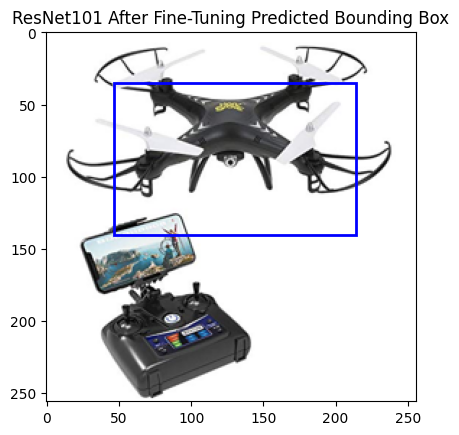

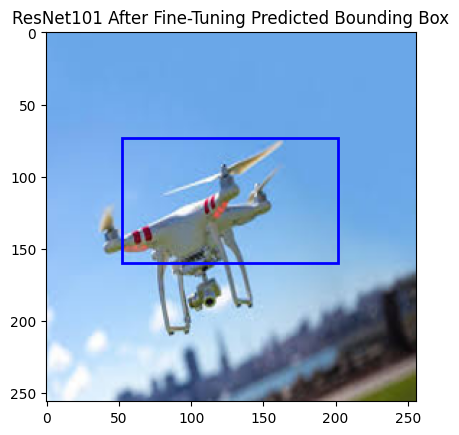

10/10 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step


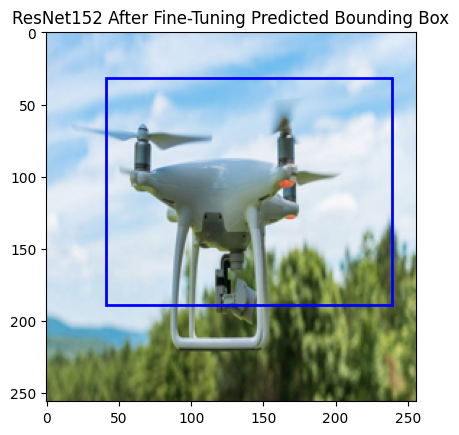

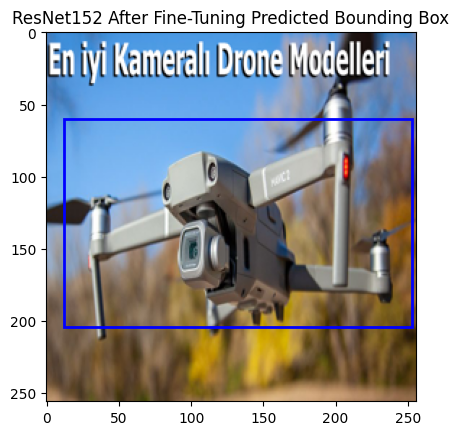

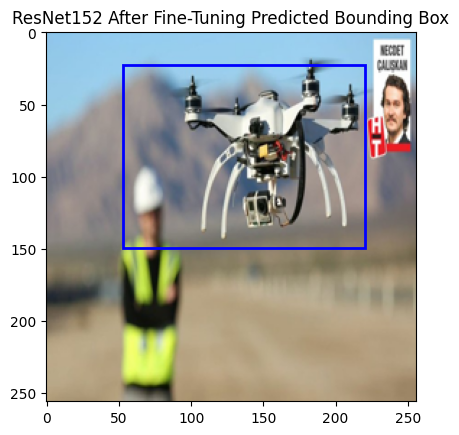

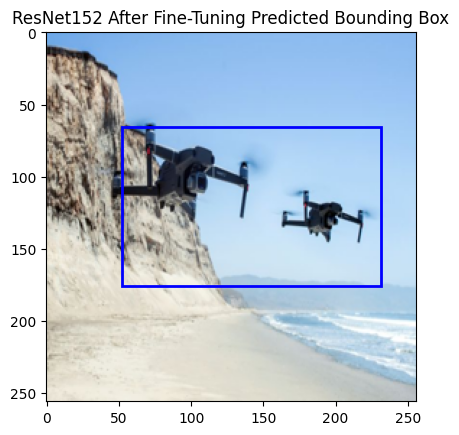

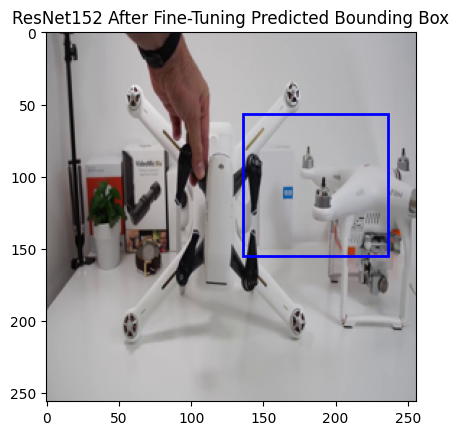

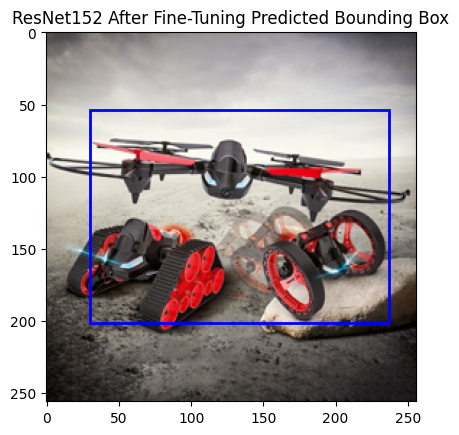

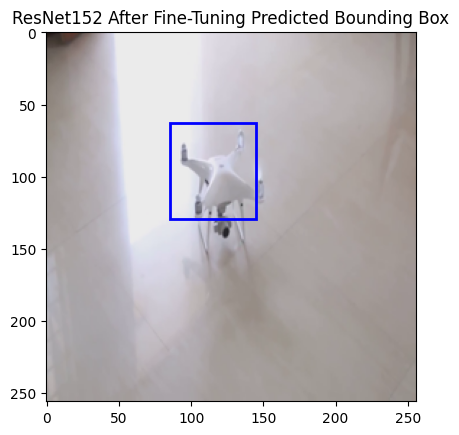

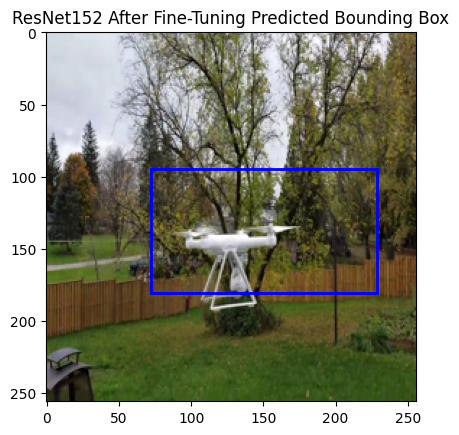

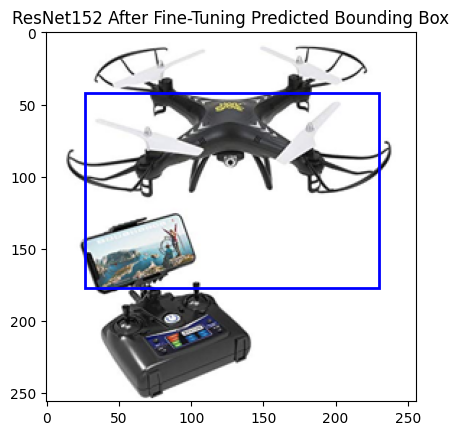

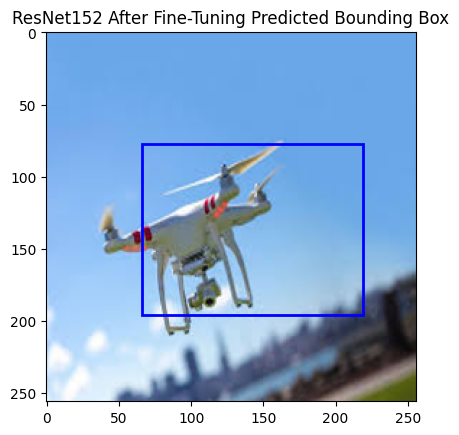

In [ ]:
# Visualize predictions after fine-tuning
visualize_predictions(resnet50_model, X_test, "ResNet50 After Fine-Tuning")
visualize_predictions(resnet101_model, X_test, "ResNet101 After Fine-Tuning")
visualize_predictions(resnet152_model, X_test, "ResNet152 After Fine-Tuning")
